In [1]:
import altair as alt
import json
import pandas as pd
import numpy as np

alt.renderers.enable('default')

RendererRegistry.enable('default')

In [2]:
def get_archive():

    # Load the archive file
    try:
        with open('archive.json', 'r') as file:
            archive= json.loads(file.read())
        print('Archive loaded.')
        
    except:
        # Create archive data structure.

        archive = {'meta':{'ids':[],
                           'audio':[],
                           'tw_ids':[],
                          'last_updated':'New File',
                          },
                  'data':[],
                  }
        print('No archived file, building new archive.json')
        
    return archive

In [3]:
archive = get_archive()

len(archive['data'])


Archive loaded.


1611

In [4]:
# Build the day based index for time series

date = pd.to_datetime("1 January 2011") # Start of the first year in the record
end = pd.to_datetime("31 December 2020") # Arbitrary end date.
span = (end - date).days
dindex = date + pd.to_timedelta(np.arange(span), unit='D')
# convert to a dataframe
indexed = pd.DataFrame(index=dindex)


In [5]:
df = pd.DataFrame(archive['data'])

In [6]:
df.sort_values('date', inplace=True, )


In [7]:
df['date'] = pd.to_datetime(df['date'])

In [8]:
# "Time's arrow neither stands still nor reverses. It merely marches forward." - Joseph Sugarman, Bojack Horseman

mountain = 'US/Mountain'

# Assign Nate's local timezone to the naive exif time 
df['photo_time'] = pd.to_datetime(
                        df['timestamp']).dt.tz_localize(
                        tz='US/Mountain',nonexistent='NaT')

# Convert UTC time from twitter to Nate's local time
df['tweet_time'] = pd.to_datetime(
                        df['tw_timestamp']).dt.tz_localize(
                        tz='UTC').dt.tz_convert(tz='US/Mountain')

# Convert date field to datetime dtype.
df['date'] = pd.to_datetime(df['date'])

df.set_index('date',drop=False,inplace=True)
df['tw_time'] = pd.to_datetime(df['tweet_time']).dt.tz_localize(None)
df['flikr_time'] = pd.to_datetime(df['timestamp'])

# df['photo_time'].tz_localize(tz=mountain)
#pt_time = photo_time.dt.tz_localize(tz='US/Mountain',nonexistent='NaT')
#pt_time
df.dtypes

# df[['tweet_time', 'tw_timestamp', 'photo_time', 'timestamp']]

camera                               object
condition                            object
date                         datetime64[ns]
fullname                             object
likes                               float64
link                                 object
photo_id                             object
photo_link                           object
raw_title                            object
replies                             float64
retweets                            float64
sun                                  object
tag                                  object
temp                                 object
text                                 object
thumb                                object
timestamp                            object
tw_id                                object
tw_timestamp                         object
tw_title                             object
url                                  object
user                                 object
walk                            

In [9]:
tz_naive = pd.date_range('2018-03-01 09:00', periods=3)
tz_aware = tz_naive.tz_localize(tz='US/Mountain')
tz_aware

DatetimeIndex(['2018-03-01 09:00:00-07:00', '2018-03-02 09:00:00-07:00',
               '2018-03-03 09:00:00-07:00'],
              dtype='datetime64[ns, US/Mountain]', freq='D')

In [10]:
# Break out time elements into date parts
indexed['year'] = indexed.index.year
indexed['month'] = indexed.index.month
indexed['weekday'] = indexed.index.weekday_name
full = indexed.join(df, how='left', sort=True)

# filter to only lines with a walk
walks = full[(full.walk == 1)==True]

In [11]:
walks[['tw_time','tweet_time','tw_timestamp', 'timestamp', 'photo_time']]

,tw_time,tweet_time,tw_timestamp,timestamp,photo_time
2011-03-25,2011-03-25 06:37:04,2011-03-25 06:37:04-06:00,2011-03-25 12:37:04,NaN,NaT
2011-03-28,2011-03-28 05:42:06,2011-03-28 05:42:06-06:00,2011-03-28 11:42:06,2011-03-28 05:39:27,2011-03-28 05:39:27-06:00
2011-03-29,2011-03-29 05:46:31,2011-03-29 05:46:31-06:00,2011-03-29 11:46:31,2011-03-29 05:44:42,2011-03-29 05:44:42-06:00
2011-03-31,2011-03-31 06:20:54,2011-03-31 06:20:54-06:00,2011-03-31 12:20:54,NaN,NaT
2011-04-02,2011-04-02 05:47:21,2011-04-02 05:47:21-06:00,2011-04-02 11:47:21,NaN,NaT
2011-04-05,2011-04-05 06:46:54,2011-04-05 06:46:54-06:00,2011-04-05 12:46:54,NaN,NaT
2011-04-06,2011-04-06 06:49:45,2011-04-06 06:49:45-06:00,2011-04-06 12:49:45,NaN,NaT
2011-04-07,2011-04-07 06:35:03,2011-04-07 06:35:03-06:00,2011-04-07 12:35:03,NaN,NaT
2011-04-08,2011-04-08 06:32:07,2011-04-08 06:32:07-06:00,2011-04-08 12:32:07,NaN,NaT
2011-04-10,2011-04-10 06:28:37,2011-04-10 06:28:37-06:00,2011-04-10 12:28:37,NaN,NaT


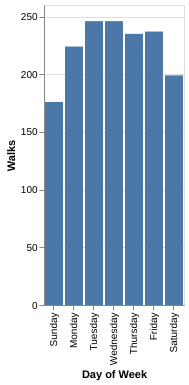

In [12]:
# Walks by day of Week
alt.Chart(walks).mark_bar().encode(
    alt.X('day(date):O', title='Day of Week'),alt.Y('count()', title='Walks'))


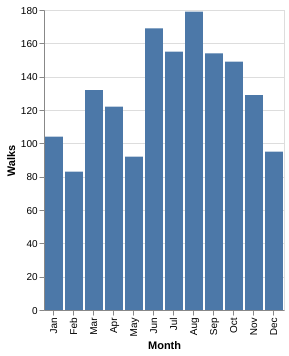

In [13]:
# Walks by Month
alt.Chart(walks).mark_bar().encode(
    alt.X('month(date):O', title='Month'),alt.Y('count()', title='Walks'))


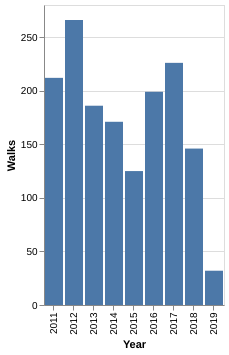

In [14]:
# Walks by Year
alt.Chart(walks).mark_bar().encode(
    alt.X('year(date):O', title='Year'),alt.Y('count()', title='Walks'))


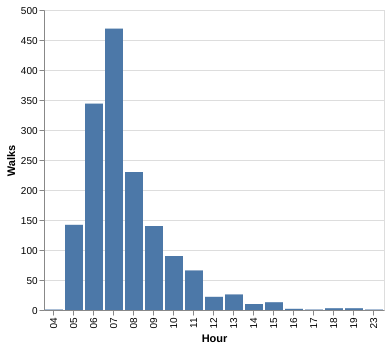

In [15]:
# Walks by hour
alt.Chart(walks).mark_bar().encode(
    alt.X('hours(tw_time):O', title='Hour'),
    alt.Y('count()', title='Walks'))


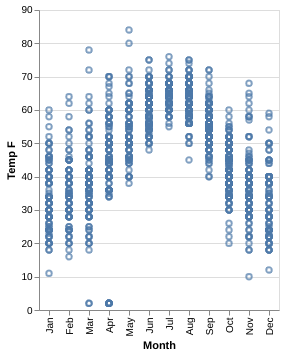

In [16]:
# Walks by Temp and month
alt.Chart(walks).mark_point().encode(
    alt.X('month(date):O', title='Month'),
    alt.Y('temp:Q', title='Temp F'))



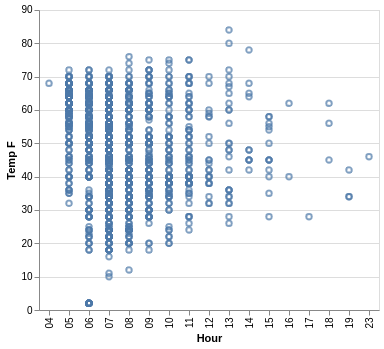

In [20]:
# Walks by day of Week
alt.Chart(walks).mark_point().encode(
    alt.X('hours(tw_time):O', title='Hour'),
    alt.Y('temp:Q', title='Temp F'))


In [18]:


#walks['tz offset'] = walks['tw_time'] - walks['flikr_time']

In [19]:
walks.columns

Index(['year', 'month', 'weekday', 'camera', 'condition', 'date', 'fullname',
       'likes', 'link', 'photo_id', 'photo_link', 'raw_title', 'replies',
       'retweets', 'sun', 'tag', 'temp', 'text', 'thumb', 'timestamp', 'tw_id',
       'tw_timestamp', 'tw_title', 'url', 'user', 'walk', 'wind', 'photo_time',
       'tweet_time', 'tw_time', 'flikr_time'],
      dtype='object')